In [13]:
# Cleanup
rm(list = ls())

In [34]:
library(Seurat)
library(ggplot2)
library(paletteer)
library(data.table)

# Set working directory
wd <- ""
setwd(wd)
rm(wd)

# Make folders for output
dir.create(path = "./plots", showWarnings = F)
dir.create(path = "./tables", showWarnings = F)
dir.create(path = "./overlays", showWarnings = F)

In [15]:
# Load the Seurat objects with the clustering
mc_matched_hm <- readRDS("./object/re_matched_hm_clustered_2.RDS") # Molecular Cartography
vz_matched_hm <- readRDS("./objects/clustered/vz_matched_hm_clustered_2.RDS") # Merscope
xen_matched_hm <- readRDS("./objects/clustered/xen_matched_hm_clustered_2.RDS") # Xenium

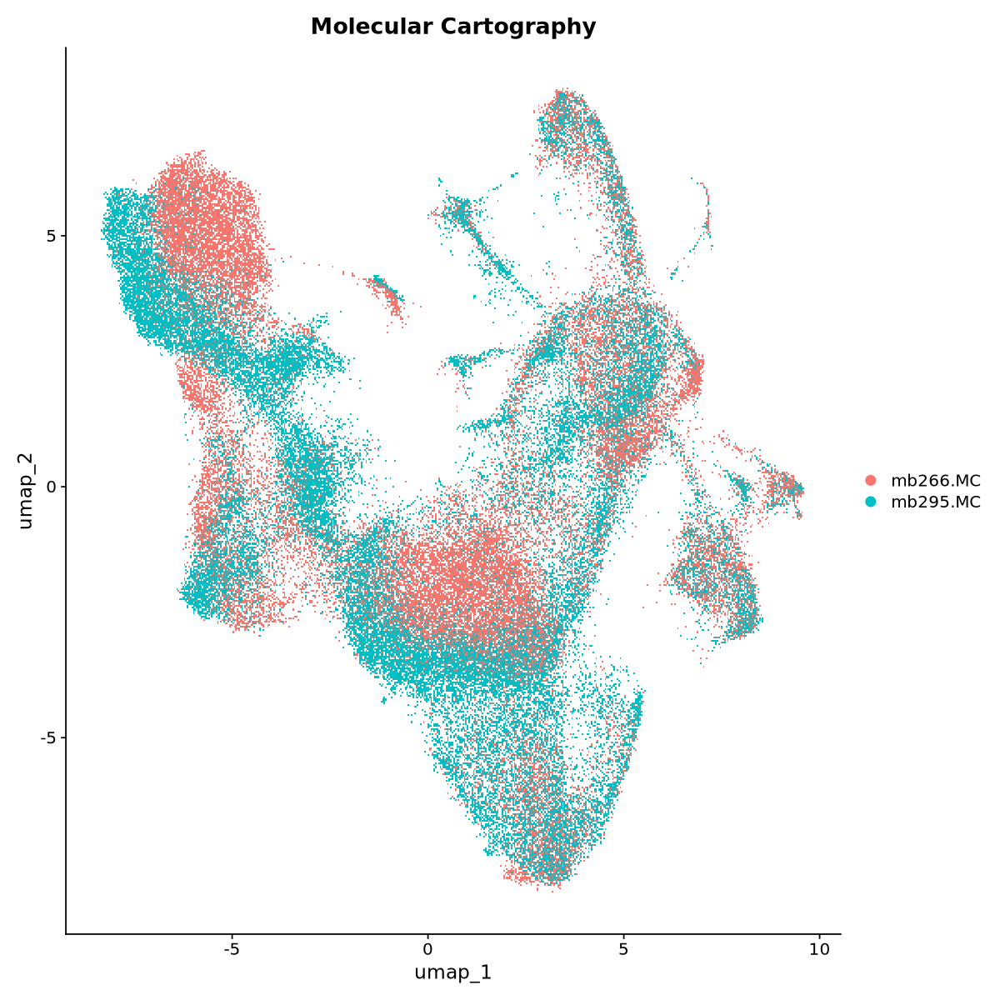

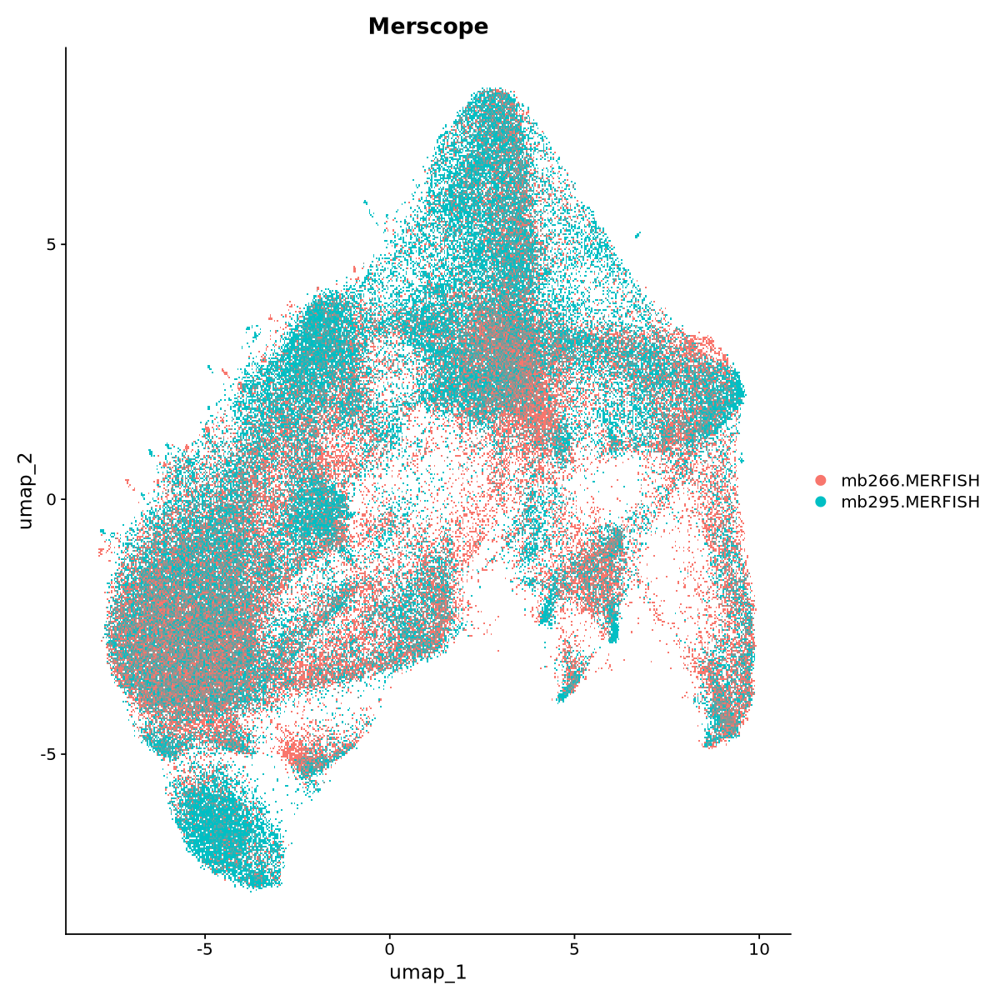

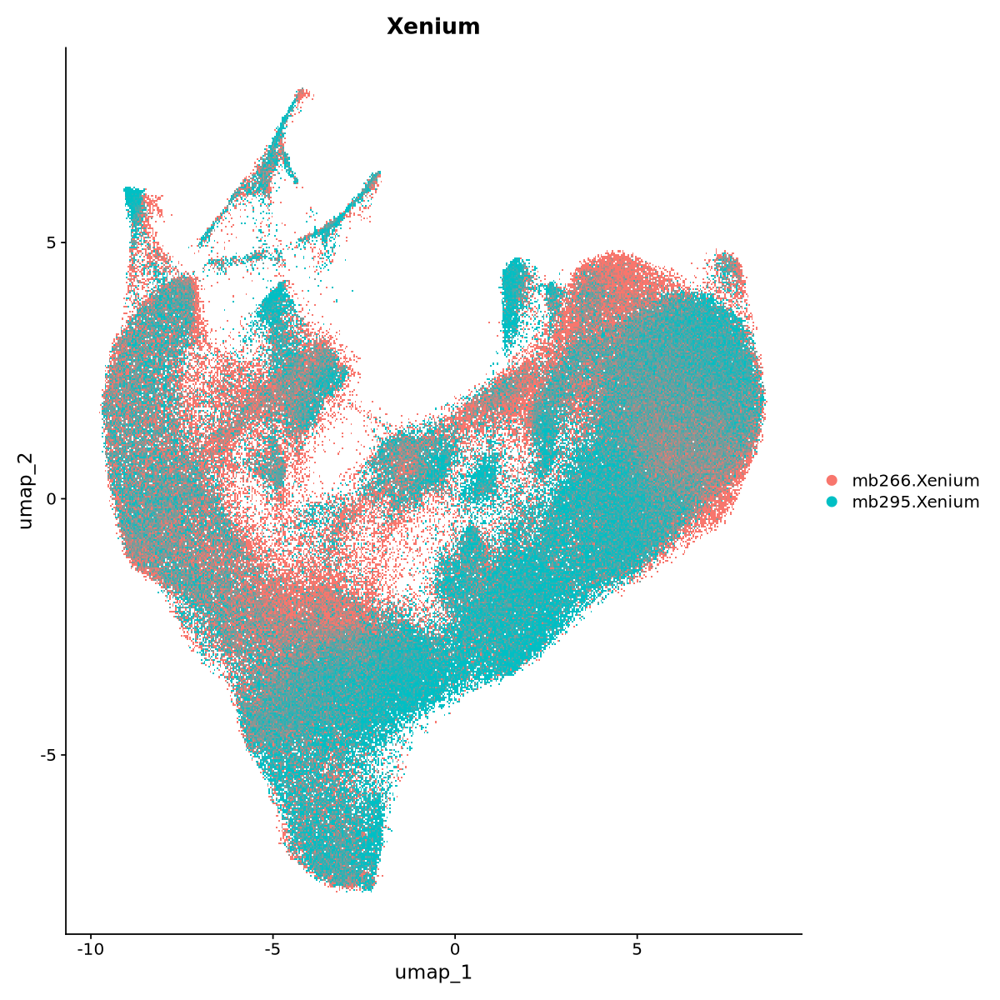

In [4]:
# Plot UMAPs coloured by Sample
options(repr.plot.width=10, repr.plot.height=10)
mc_sample_dimplot <- DimPlot(mc_matched_hm, reduction = "umap", group.by = "samples", raster = T) + ggtitle("Molecular Cartography")
vz_sample_dimplot <- DimPlot(vz_matched_hm, reduction = "umap", group.by = "samples", raster = T) + ggtitle("Merscope")
xen_sample_dimplot <- DimPlot(xen_matched_hm, reduction = "umap", group.by = "samples", raster = T) + ggtitle("Xenium")

print(mc_sample_dimplot)
print(vz_sample_dimplot)
print(xen_sample_dimplot)

In [16]:
# Convert coluns with clusters to numeric and set the resolution
mc_matched_hm@meta.data[grep("SCT", colnames(mc_matched_hm@meta.data))] <- lapply(mc_matched_hm@meta.data[grep("SCT", colnames(mc_matched_hm@meta.data))], as.numeric)
vz_matched_hm@meta.data[grep("SCT", colnames(vz_matched_hm@meta.data))] <- lapply(vz_matched_hm@meta.data[grep("SCT", colnames(vz_matched_hm@meta.data))], as.numeric)
xen_matched_hm@meta.data[grep("SCT", colnames(xen_matched_hm@meta.data))] <- lapply(xen_matched_hm@meta.data[grep("SCT", colnames(xen_matched_hm@meta.data))], as.numeric)

mc_resolution <- "SCT_snn_res.0.55"
vz_resolution <- "SCT_snn_res.0.55"
xen_resolution <- "SCT_snn_res.0.55"

# Manually annotated cells types:
# See: https://www.nature.com/articles/s41467-023-44117-x/figures/7

# Molecular Cartography 
mc_cell_types <- c(
    "Early CGNP-like", "Differentiated neuronal-like", "Early CGNP-like, proliferating",
     "Stromal / Meningeal",  "Late CGNP-like", "Stromal / Meningeal (2)",
    "Monocytes",  "Migrating CGNP-like" , "Vascular / Endothelial",
    "Migrating CGNP-like (2)", "Other Immune", "TULP1+ cells",
    "Stromal / Meningeal (3)", "Astrocyte / Astrocytic-like")
mc_matched_hm@meta.data$cell_types <- mc_cell_types[mc_matched_hm@meta.data[[mc_resolution]]]
mc_resolution <- "cell_types"

# Merscope
vz_cell_types <- c(
    "Differentiated neuronal-like", "Early CGNP-like", "Early CGNP-like, proliferating",
    "Stromal / Meningeal", "Migrating CGNP-like", "Astrocyte / Astrocytic-like",
    "Differentiated neuronal-like (2)",  "Monocytes", "Differentiated neuronal-like (3)",
    "Vascular / Endothelial", "Differentiated neuronal-like (4)", "Other Immune",
    "Other Immune (2)", "Other Immune (3)", "Early CGNP-like (2)")

vz_matched_hm@meta.data$cell_types <- vz_cell_types[vz_matched_hm@meta.data[[vz_resolution]]]
vz_resolution <- "cell_types"

# Xenium
xen_cell_types <- c(
    "Differentiated neuronal-like", "Differentiated neuronal-like (2)",  "Other Immune",
    "Other Immune (2)", "B Cells", "Oligodendrocyte-like",
    "Differentiated neuronal-like (3)", "Late CGNP-like", "Early CGNP-like",
    "Vascular / Endothelial", "Stromal / Meningeal", "Monocytes",
     "Astrocyte / Astrocytic-like",  "Differentiated neuronal-like (4)", 
    "Early CGNP-like, proliferating")

xen_matched_hm@meta.data$cell_types <- xen_cell_types[xen_matched_hm@meta.data[[xen_resolution]]]
xen_resolution <- "cell_types"

In [17]:
# Ordered cell type annotations, colors and genes for plotting

all_types <- sort(unique(c(mc_cell_types, vz_cell_types, xen_cell_types)))

ordered_cell_types <- c("Astrocyte / Astrocytic-like",
    "Differentiated neuronal-like",
    "Differentiated neuronal-like (2)",
    "Differentiated neuronal-like (3)",
    "Differentiated neuronal-like (4)",
    "Oligodendrocyte-like",
    "Early CGNP-like",
    "Early CGNP-like (2)",
    "Early CGNP-like, proliferating",
    "Late CGNP-like",
    "Migrating CGNP-like",
    "Migrating CGNP-like (2)",
    "TULP1+ cells",
    "Stromal / Meningeal",
    "Stromal / Meningeal (2)",
    "Stromal / Meningeal (3)",
    "Vascular / Endothelial",
    "Monocytes",
    "Other Immune",
    "Other Immune (2)",
    "Other Immune (3)",
    "Other Immune (4)",
    "B Cells")

palette <- c(
    "Astrocyte / Astrocytic-like" = "#085CF8FF",  # Blue
    "Differentiated neuronal-like" = "#1483A8FF", # Blue-Green
    "Differentiated neuronal-like (2)" = "#41B8D9FF",
    "Differentiated neuronal-like (3)" = "#37B7ECFF",
    "Differentiated neuronal-like (4)" = "#5978B3FF",
    "Oligodendrocyte-like" = "#481EFFFF", # Blue-violet
    "Early CGNP-like" = "#009900FF", # Dark Green
    "Early CGNP-like (2)"  = "#00CC00FF", 
    "Early CGNP-like, proliferating" = "#00FF00FF", # Bright Green
    "Late CGNP-like" = "#C4A484FF", # Brown
    "Migrating CGNP-like" = "#88CC00FF", # Yellow Green
    "Migrating CGNP-like (2)"  = "#449900FF",
    "TULP1+ cells" = "#00FFFFFF", # Cyan
    "Stromal / Meningeal" = "#FFFF00FF", # Yellow - Orange
    "Stromal / Meningeal (2)" = "#FFA700FF",
    "Stromal / Meningeal (3)" = "#CCCC00FF",
    "Vascular / Endothelial" = "#8800FFFF", # Dark Violet
    "Monocytes" = "#FF0000FF", # Red
    "Other Immune" = "#FF008DFF",
    "Other Immune (2)" = "#D6204E",
    "Other Immune (3)" = "#FFC0CB",
    "Other Immune (4)" = "#890256",
    "B Cells" = "#FF00FFFF" # Magenta 
)

# Alphabetically sorted list for plotting
genes <- sort(rownames(xen_matched_hm@assays$MultiTech@meta.features))

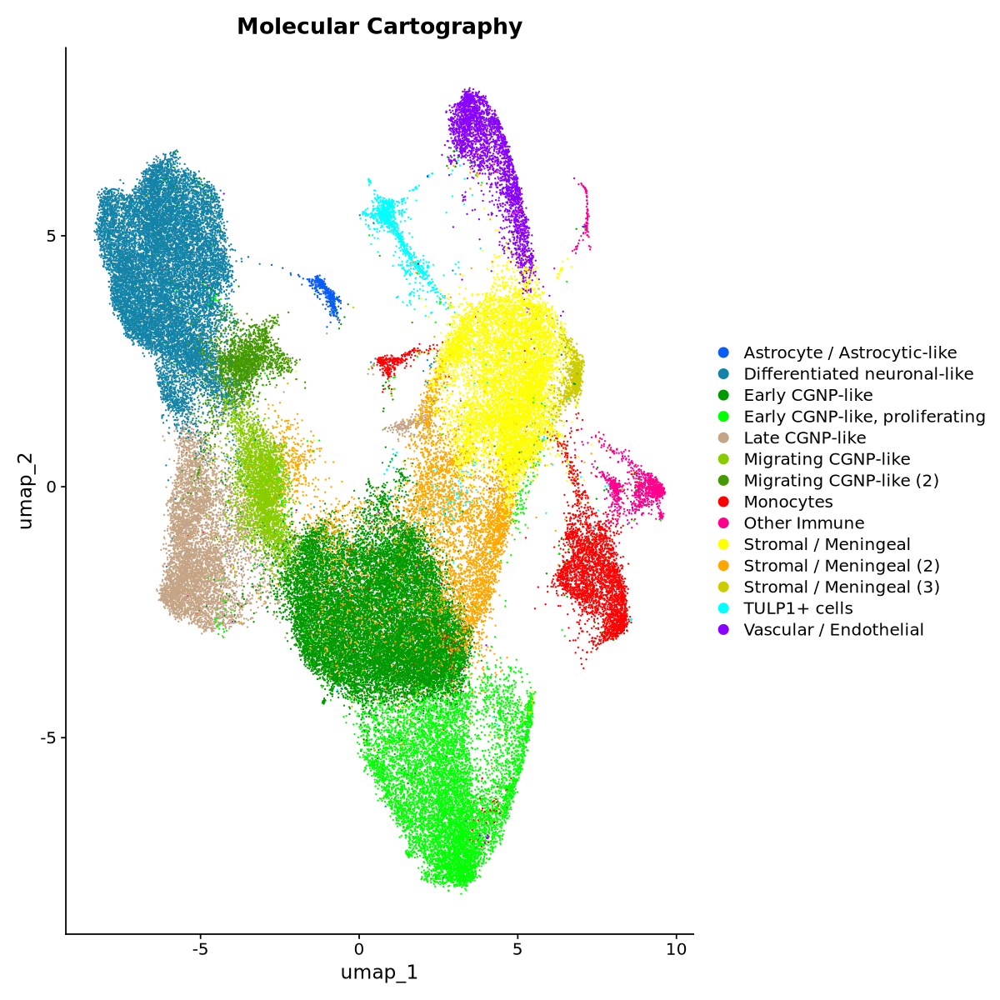

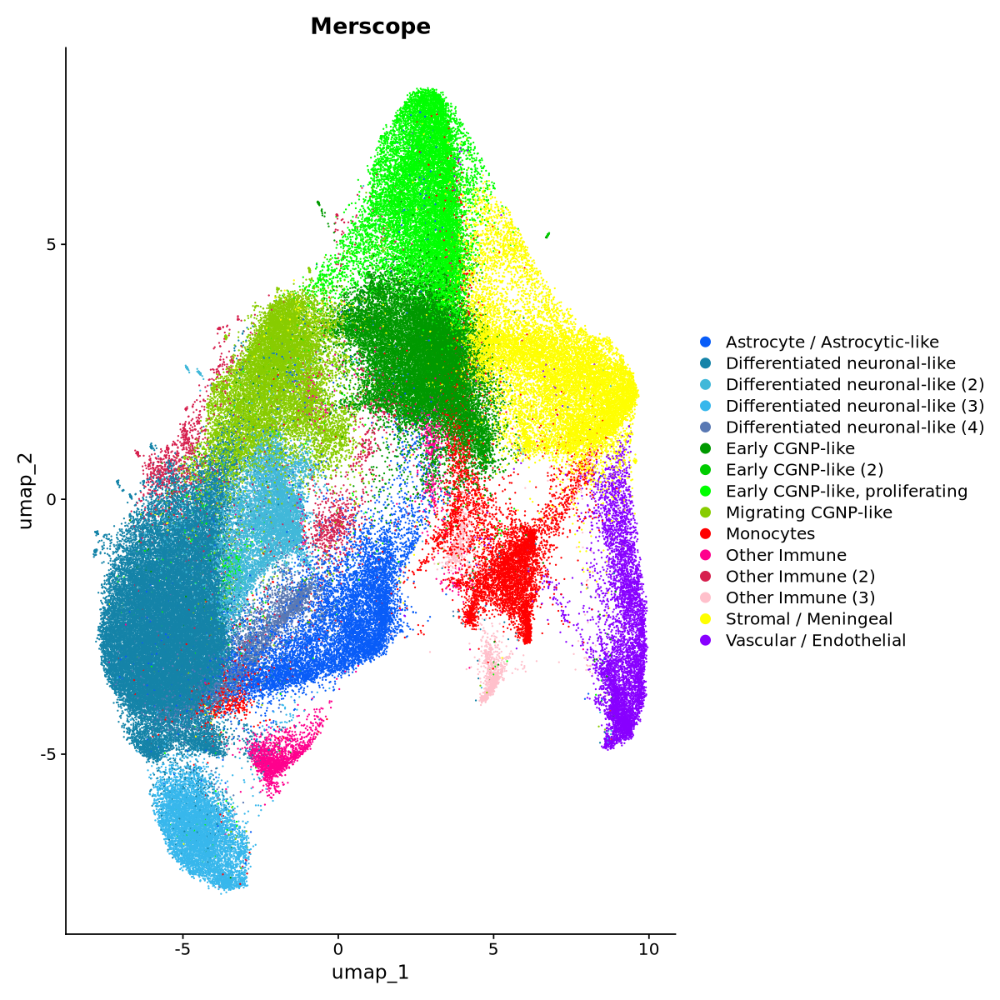

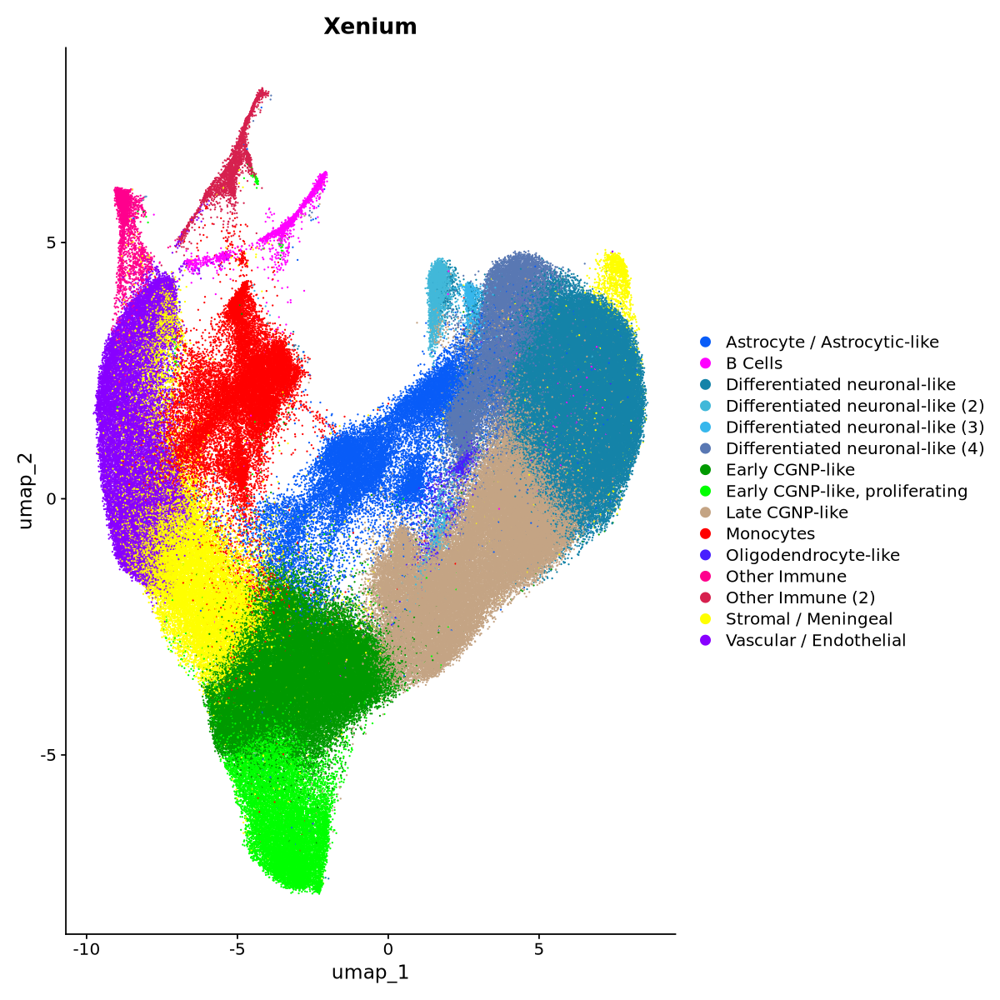

In [18]:
options(repr.plot.width=10, repr.plot.height=10)

# Draw UMAPs coloured by cell type
mc_umap <- DimPlot(mc_matched_hm, reduction = "umap", group.by = mc_resolution, cols = palette, raster = F) + ggtitle("Molecular Cartography")
vz_umap <- DimPlot(vz_matched_hm, reduction = "umap", group.by = vz_resolution, cols = palette, raster = F) + ggtitle("Merscope")
xen_umap <- DimPlot(xen_matched_hm, reduction = "umap", group.by = xen_resolution, cols = palette, raster = F) + ggtitle("Xenium")

ggsave(plot = mc_umap, filename = "./plots/mc_umap.pdf", width = 20, height = 20)
ggsave(plot = vz_umap, filename = "./plots/vz_umap.pdf", width = 20, height = 20)
ggsave(plot = xen_umap, filename = "./plots/xen_umap.pdf", width = 20, height = 20)

print(mc_umap)
print(vz_umap)
print(xen_umap)

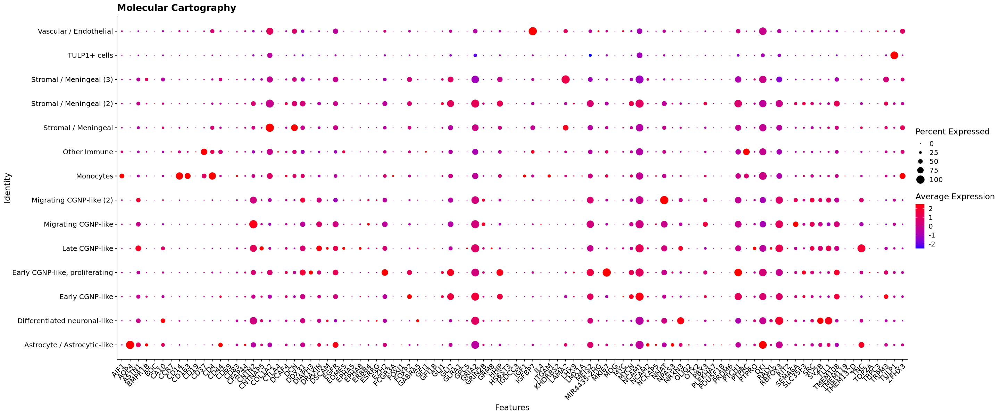

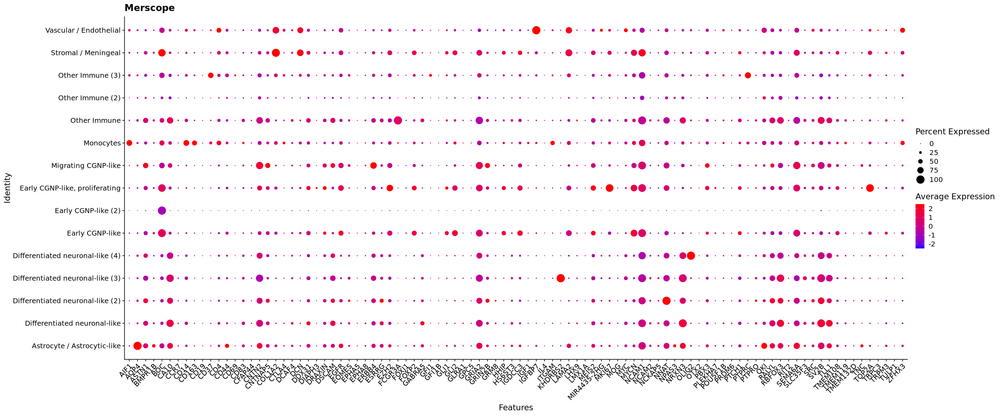

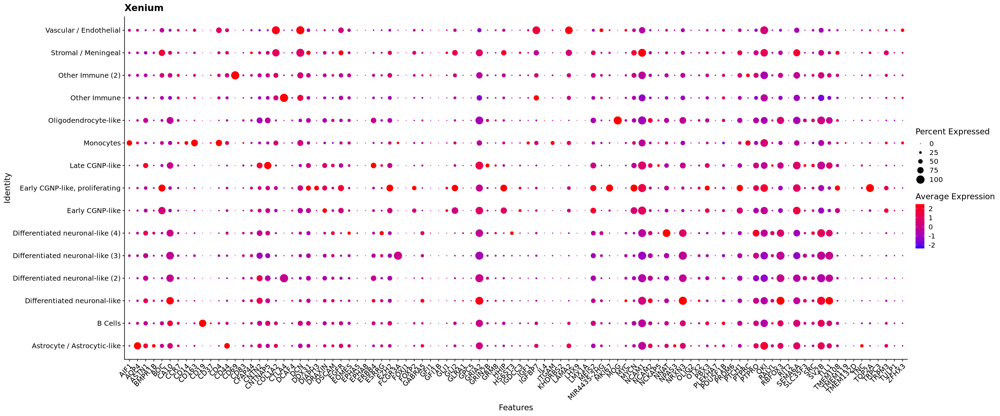

In [19]:
options(repr.plot.width=24, repr.plot.height=10)

# Draw dotplots
mc_dotplot <- DotPlot(mc_matched_hm, features = genes, group.by = mc_resolution, cols = c("blue", "red"), assay = "MultiTech") + RotatedAxis() + ggtitle("Molecular Cartography")
vz_dotplot <- DotPlot(vz_matched_hm, features = genes, group.by = vz_resolution, cols = c("blue", "red"), assay = "MultiTech") + RotatedAxis() + ggtitle("Merscope")
xen_dotplot <- DotPlot(xen_matched_hm, features = genes, group.by = xen_resolution, cols = c("blue", "red"), assay = "MultiTech") + RotatedAxis() + ggtitle("Xenium")

ggsave(plot = mc_dotplot, filename = "./plots/mc_dotplot.pdf", width = 36, height = 15)
ggsave(plot = vz_dotplot, filename = "./plots/vz_dotplot.pdf", width = 36, height = 15)
ggsave(plot = xen_dotplot, filename = "./plots/xen_dotplot.pdf", width = 36, height = 15)

print(mc_dotplot) 
print(vz_dotplot)
print(xen_dotplot)

In [20]:
# Modified from Seurat::DotPlot to generate a data.table with the scaled data for the dotplots above
DotPlotData <- function(
  object,
  features,
  assay = NULL,
  cols = c("lightgrey", "blue"),
  col.min = -2.5,
  col.max = 2.5,
  dot.min = 0,
  dot.scale = 6,
  idents = NULL,
  group.by = NULL,
  split.by = NULL,
  cluster.idents = FALSE,
  scale = TRUE,
  scale.by = 'radius',
  scale.min = NA,
  scale.max = NA
) {
  assay <- assay %||% DefaultAssay(object = object)
  DefaultAssay(object = object) <- assay
  split.colors <- !is.null(x = split.by) && !any(cols %in% rownames(x = brewer.pal.info))
  scale.func <- switch(
    EXPR = scale.by,
    'size' = scale_size,
    'radius' = scale_radius,
    stop("'scale.by' must be either 'size' or 'radius'")
  )
  feature.groups <- NULL
  if (is.list(features) | any(!is.na(names(features)))) {
    feature.groups <- unlist(x = sapply(
      X = 1:length(features),
      FUN = function(x) {
        return(rep(x = names(x = features)[x], each = length(features[[x]])))
      }
    ))
    if (any(is.na(x = feature.groups))) {
      warning(
        "Some feature groups are unnamed.",
        call. = FALSE,
        immediate. = TRUE
      )
    }
    features <- unlist(x = features)
    names(x = feature.groups) <- features
  }
  cells <- unlist(x = CellsByIdentities(object = object, cells = colnames(object[[assay]]), idents = idents))
  data.features <- FetchData(object = object, vars = features, cells = cells)
  data.features$id <- if (is.null(x = group.by)) {
    Idents(object = object)[cells, drop = TRUE]
  } else {
    object[[group.by, drop = TRUE]][cells, drop = TRUE]
  }
  if (!is.factor(x = data.features$id)) {
    data.features$id <- factor(x = data.features$id)
  }
  id.levels <- levels(x = data.features$id)
  data.features$id <- as.vector(x = data.features$id)
  if (!is.null(x = split.by)) {
    splits <- FetchData(object = object, vars = split.by)[cells, split.by]
    if (split.colors) {
      if (length(x = unique(x = splits)) > length(x = cols)) {
        stop(paste0("Need to specify at least ", length(x = unique(x = splits)), " colors using the cols parameter"))
      }
      cols <- cols[1:length(x = unique(x = splits))]
      names(x = cols) <- unique(x = splits)
    }
    data.features$id <- paste(data.features$id, splits, sep = '_')
    unique.splits <- unique(x = splits)
    id.levels <- paste0(rep(x = id.levels, each = length(x = unique.splits)), "_", rep(x = unique(x = splits), times = length(x = id.levels)))
  }
  data.plot <- lapply(
    X = unique(x = data.features$id),
    FUN = function(ident) {
      data.use <- data.features[data.features$id == ident, 1:(ncol(x = data.features) - 1), drop = FALSE]
      avg.exp <- apply(
        X = data.use,
        MARGIN = 2,
        FUN = function(x) {
          return(mean(x = expm1(x = x)))
        }
      )
      pct.exp <- apply(X = data.use, MARGIN = 2, FUN = PercentAbove, threshold = 0)
      return(list(avg.exp = avg.exp, pct.exp = pct.exp))
    }
  )
  names(x = data.plot) <- unique(x = data.features$id)
  if (cluster.idents) {
    mat <- do.call(
      what = rbind,
      args = lapply(X = data.plot, FUN = unlist)
    )
    mat <- scale(x = mat)
    id.levels <- id.levels[hclust(d = dist(x = mat))$order]
  }
  data.plot <- lapply(
    X = names(x = data.plot),
    FUN = function(x) {
      data.use <- as.data.frame(x = data.plot[[x]])
      data.use$features.plot <- rownames(x = data.use)
      data.use$id <- x
      return(data.use)
    }
  )
  data.plot <- do.call(what = 'rbind', args = data.plot)
  if (!is.null(x = id.levels)) {
    data.plot$id <- factor(x = data.plot$id, levels = id.levels)
  }
  ngroup <- length(x = levels(x = data.plot$id))
  if (ngroup == 1) {
    scale <- FALSE
    warning(
      "Only one identity present, the expression values will be not scaled",
      call. = FALSE,
      immediate. = TRUE
    )
  } else if (ngroup < 5 & scale) {
    warning(
      "Scaling data with a low number of groups may produce misleading results",
      call. = FALSE,
      immediate. = TRUE
    )
  }
  avg.exp.scaled <- sapply(
    X = unique(x = data.plot$features.plot),
    FUN = function(x) {
      data.use <- data.plot[data.plot$features.plot == x, 'avg.exp']
      if (scale) {
        data.use <- scale(x = log1p(data.use))
        data.use <- MinMax(data = data.use, min = col.min, max = col.max)
      } else {
        data.use <- log1p(x = data.use)
      }
      return(data.use)
    }
  )
  avg.exp.scaled <- as.vector(x = t(x = avg.exp.scaled))
  if (split.colors) {
    avg.exp.scaled <- as.numeric(x = cut(x = avg.exp.scaled, breaks = 20))
  }
  data.plot$avg.exp.scaled <- avg.exp.scaled
  data.plot$features.plot <- factor(
    x = data.plot$features.plot,
    levels = features
  )
  data.plot$pct.exp[data.plot$pct.exp < dot.min] <- NA
  data.plot$pct.exp <- data.plot$pct.exp * 100
  if (split.colors) {
    splits.use <- unlist(x = lapply(
      X = data.plot$id,
      FUN = function(x)
      sub(
        paste0(".*_(",
               paste(sort(unique(x = splits), decreasing = TRUE),
                     collapse = '|'
                     ),")$"),
        "\\1",
        x
        )
      )
      )
  }
  data.plot <- as.data.table(data.plot)
  setnames(data.plot, old = c("avg.exp", "avg.exp.scaled", "pct.exp"), new = c("mean_expression", "mean_expression_scaled", "expressed_in_percent_cells"))  
  data.plot <- dcast(data.plot, id~features.plot, value.var = c("mean_expression", "mean_expression_scaled", "expressed_in_percent_cells"), fill = TRUE)
  return(data.plot)
}

# Get a table with the data used for each dotplot
mc_dotplot_data <- DotPlotData(mc_matched_hm, features = genes, group.by = mc_resolution, cols = c("blue", "red"), assay = "MultiTech") 
vz_dotplot_data <- DotPlotData(vz_matched_hm, features = genes, group.by = vz_resolution, cols = c("blue", "red"), assay = "MultiTech") 
xen_dotplot_data <- DotPlotData(xen_matched_hm, features = genes, group.by = xen_resolution, cols = c("blue", "red"), assay = "MultiTech")

# Collect the data from the 3 technologies into a single table
dotplot_data <- rbindlist(list(MC = mc_dotplot_data, MERSCOPE = vz_dotplot_data, XENIUM = xen_dotplot_data), use.names = TRUE, idcol = "spatial_technology")
dotplot_data
fwrite(x = dotplot_data, file = "./tables/DotPlotData.csv", sep = ",")

spatial_technology,id,mean_expression_AIF1,mean_expression_AQP4,mean_expression_ASTN1,mean_expression_BMPR1B,mean_expression_BOC,mean_expression_CA10,mean_expression_CCR7,mean_expression_CD14,⋯,expressed_in_percent_cells_TLL1,expressed_in_percent_cells_TMEM108,expressed_in_percent_cells_TMEM119,expressed_in_percent_cells_TMEM132D,expressed_in_percent_cells_TNC,expressed_in_percent_cells_TOP2A,expressed_in_percent_cells_TRPC3,expressed_in_percent_cells_TRPM3,expressed_in_percent_cells_TULP1,expressed_in_percent_cells_ZFHX3
<chr>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
MC,Astrocyte / Astrocytic-like,2.517185e-01,4.989616e+34,3.200513e+01,12.53004774,0.000000e+00,7.673085e+04,0.0000000000,4.659894e-01,⋯,39.508929,45.75893,0.22321429,0.44642857,67.857143,0.00000000,1.78571429,35.267857,17.1875000,29.464286
MC,Differentiated neuronal-like,1.491862e-01,4.013209e-01,6.121458e+00,0.21771649,3.456148e-04,3.759829e+07,0.0002304099,1.173007e+01,⋯,89.091519,35.54811,0.09386524,0.44921220,38.397586,0.13409319,0.45591686,28.977539,20.2011398,8.407643
MC,Early CGNP-like,2.238200e-01,2.655480e-01,4.689615e+00,1.40785787,3.535761e-03,3.086724e+02,0.0032600579,4.186557e-01,⋯,22.400686,64.84710,0.06287511,0.21720492,22.360674,0.19434124,1.41754787,50.683052,20.1829094,22.617891
MC,"Early CGNP-like, proliferating",3.009996e-01,8.163425e-02,3.112883e+00,0.34669932,3.394630e-03,1.398151e+03,0.0011981047,1.032006e+00,⋯,26.275421,66.72865,0.09296920,0.24404416,38.361418,7.82103428,6.82161534,46.333527,27.0424172,26.496223
MC,Late CGNP-like,1.520210e-01,5.292155e-01,1.324087e+02,0.09273101,1.807766e-03,3.800786e+04,0.0000000000,5.693292e-01,⋯,64.544976,57.35578,0.03506926,0.50850430,96.738559,0.15781168,0.59617745,33.228126,20.0070139,14.343328
MC,Migrating CGNP-like,2.007271e-01,1.313292e-01,5.572821e+00,0.03976507,1.011945e-03,1.641311e+01,0.0000000000,2.064527e-01,⋯,39.752650,68.46290,0.00000000,0.32391048,45.730271,0.20612485,0.64782097,10.070671,31.8021201,9.746761
MC,Migrating CGNP-like (2),2.824792e-01,4.930790e-02,1.010883e+02,0.11338743,1.732139e-03,3.490676e+04,0.0000000000,4.579449e-01,⋯,56.854839,56.09879,0.10080645,0.30241935,50.252016,0.15120968,0.90725806,12.147177,30.6955645,11.290323
MC,Monocytes,4.814478e+01,9.722873e-01,1.704280e+00,0.33592440,0.000000e+00,6.903471e+01,0.0024365880,3.461155e+35,⋯,22.036302,39.70505,2.04197391,0.02836075,21.298922,0.62393647,1.41803744,25.950085,15.3998866,69.653999
MC,Other Immune,1.586144e+00,7.214421e-02,1.203235e+00,0.44533735,1.570642e-03,3.008270e+01,0.1661527486,6.008409e+04,⋯,15.813528,39.48812,0.36563071,0.09140768,16.544790,0.45703839,2.01096892,26.782450,14.6252285,41.042048


Centering and scaling data matrix

Centering and scaling data matrix

Centering and scaling data matrix



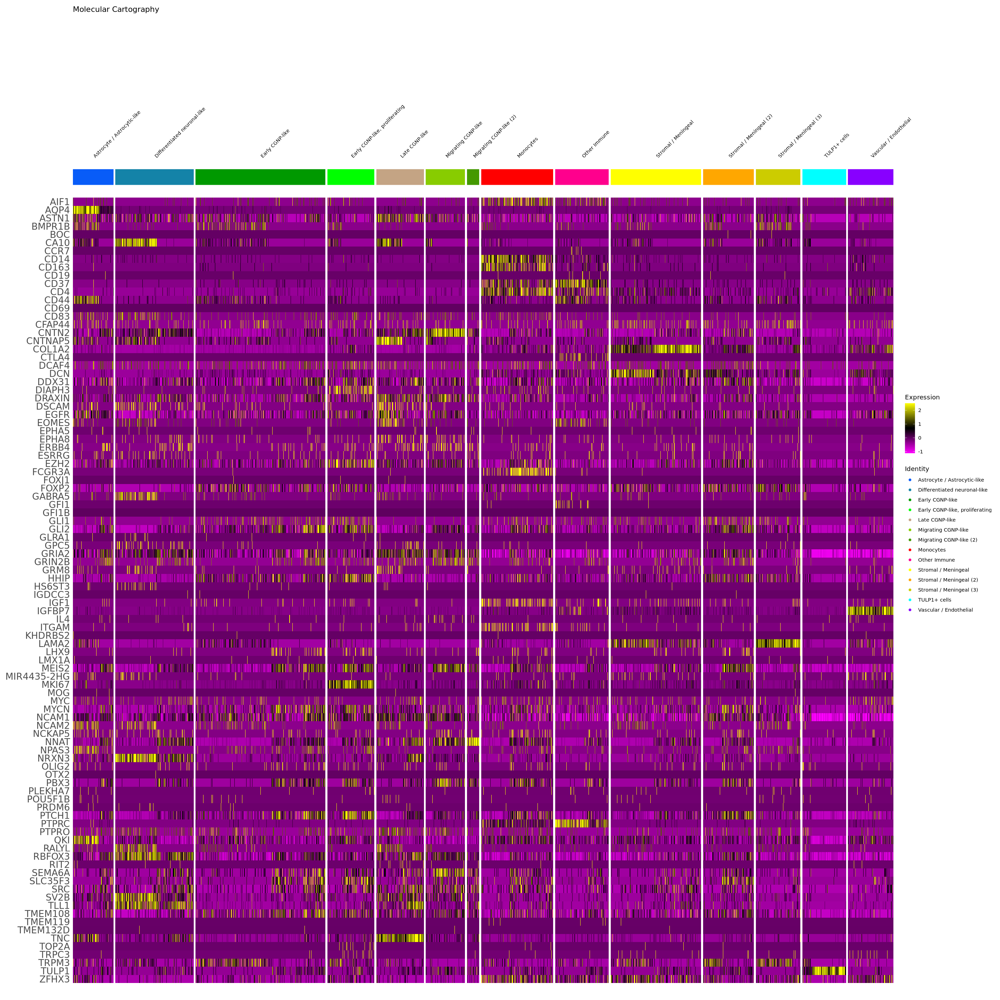

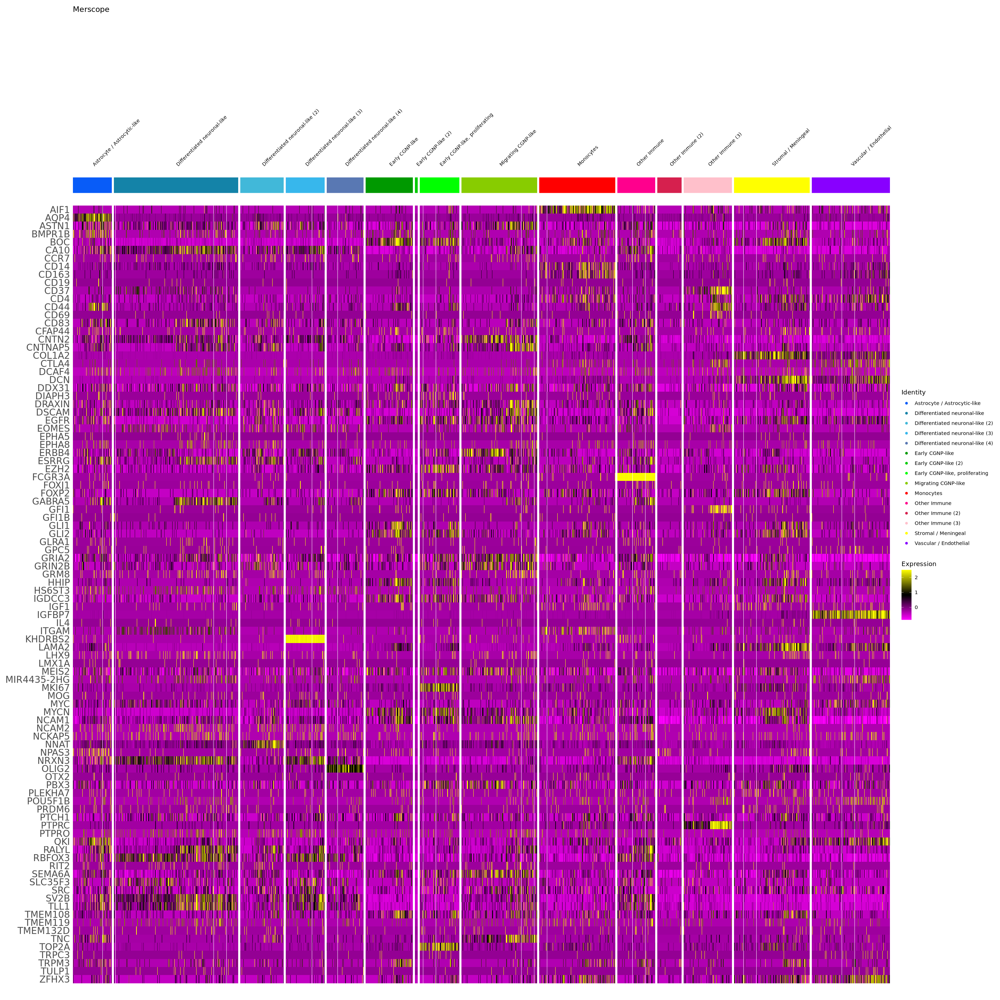

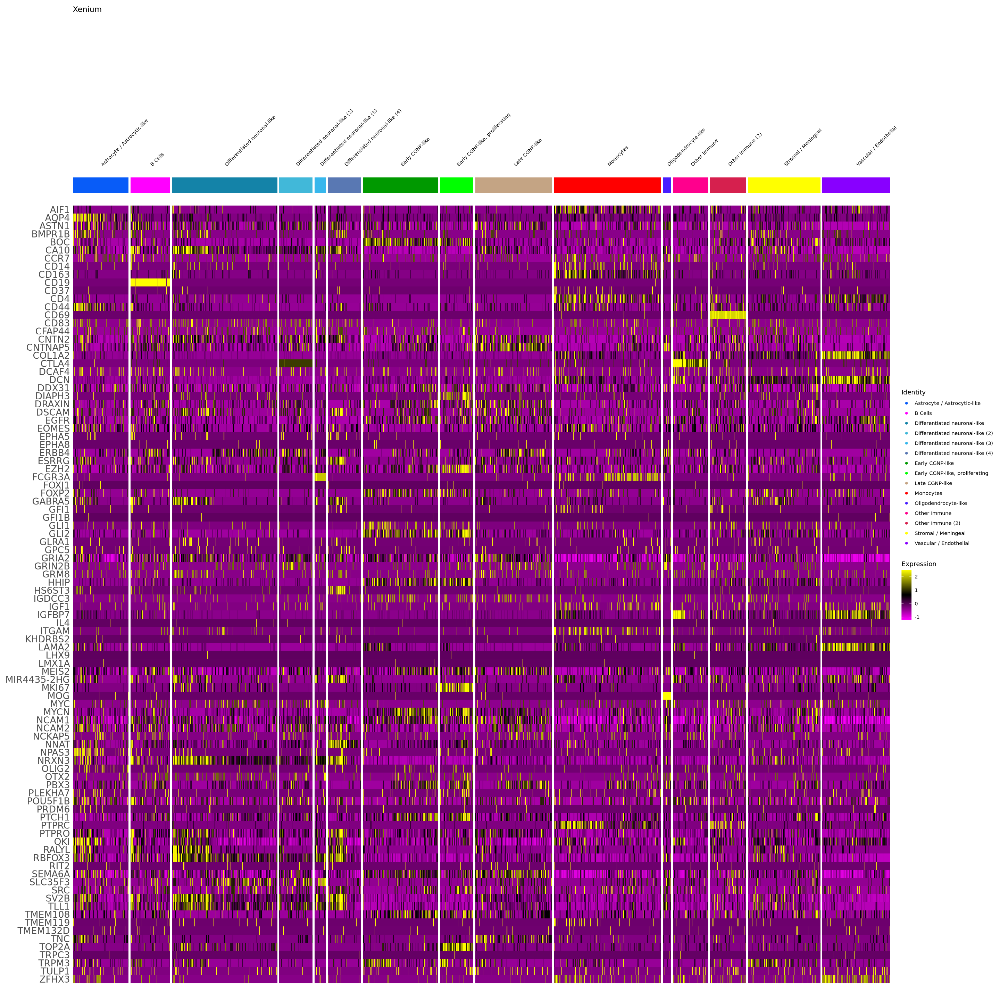

In [35]:
options(repr.plot.width=24, repr.plot.height=24)

# Subset 500 cells, scale and center the raw counts
mc_subset <- suppressWarnings(subset(mc_matched_hm, downsample = 500))
mc_subset@active.assay <- "MultiTech"
mc_subset <- ScaleData(mc_subset)
                 
vz_subset <- suppressWarnings(subset(vz_matched_hm, downsample = 500))
vz_subset@active.assay <- "MultiTech"
vz_subset <- ScaleData(vz_subset)
                 
xen_subset <- suppressWarnings(subset(xen_matched_hm, downsample = 500))
xen_subset@active.assay <- "MultiTech"
xen_subset <- ScaleData(xen_subset)

# Draw Heatmaps
suppressWarnings(mc_heatmap <- DoHeatmap(mc_subset, features = genes, size = 3, 
    group.by = mc_resolution, group.color = palette, raster = FALSE) + theme(axis.text = element_text(size = 16)) + ggtitle("Molecular Cartography"))
suppressWarnings(vz_heatmap <- DoHeatmap(vz_subset, features = genes, size = 3, 
    group.by = vz_resolution, group.color = palette, raster = FALSE) + theme(axis.text = element_text(size = 16)) + ggtitle("Merscope"))
suppressWarnings(xen_heatmap <- DoHeatmap(xen_subset, features = genes, size = 3, 
    group.by = xen_resolution, group.color = palette, raster = FALSE) + theme(axis.text = element_text(size = 16)) + ggtitle("Xenium"))                 

ggsave(plot = mc_heatmap, filename = "./plots/mc_heatmap.pdf", width = 24, height = 24)
ggsave(plot = vz_heatmap, filename = "./plots/vz_heatmap.pdf", width = 24, height = 24)
ggsave(plot = xen_heatmap, filename = "./plots/xen_heatmap.pdf", width = 24, height = 24)

print(mc_heatmap)
print(vz_heatmap)
print(xen_heatmap)

In [25]:
# Prepara data tables for barplots of cell type frequencies by sample and by technology

mc_cells <- data.table(cell_type = mc_matched_hm@meta.data[[mc_resolution]], sample_name = mc_matched_hm@meta.data$samples, spatial_tech = mc_matched_hm@meta.data$spatial_tech)
vz_cells <-  data.table(cell_type = vz_matched_hm@meta.data[[mc_resolution]], sample_name = vz_matched_hm@meta.data$samples, spatial_tech = vz_matched_hm@meta.data$spatial_tech)
xen_cells <-  data.table(cell_type = xen_matched_hm@meta.data[[mc_resolution]], sample_name = xen_matched_hm@meta.data$samples, spatial_tech = xen_matched_hm@meta.data$spatial_tech)


mc_cells <- unique(mc_cells[, N := .N, by = c("cell_type", "sample_name", "spatial_tech")])
vz_cells <- unique(vz_cells[, N := .N, by = c("cell_type", "sample_name", "spatial_tech")])
xen_cells <- unique(xen_cells[, N := .N, by = c("cell_type", "sample_name", "spatial_tech")])

all_cells <- rbind(mc_cells, xen_cells, vz_cells)

# Data tables of cell type frequencies by sample
all_cells_samples <- all_cells[, .(cell_type, sample_name, spatial_tech, N)]
all_cells_samples[, total := sum(N), by = sample_name]
all_cells_samples[, percent := N / total * 100]
all_cells_samples[, breaks := paste0(sample_name, " (", total, ")")]
all_cells_samples[, count_labels := paste0(N, " = ", round(percent, 2), "%")]
all_cells_samples$ordering <- factor(all_cells_samples$cell_type, levels = ordered_cell_types)
setorder(all_cells_samples, -ordering)

#Data tables of cell type frequencies by technology
all_cells_tech  <- unique(all_cells[, .(cell_type, spatial_tech, N)])
all_cells_tech[, N := sum(N), by = c("cell_type", "spatial_tech")]
all_cells_tech <- unique(all_cells_tech[, .(cell_type, spatial_tech, N)])
all_cells_tech[, total := sum(N), by = spatial_tech]
all_cells_tech[, percent := N / total * 100]
all_cells_tech[, breaks := paste0(spatial_tech, " (", total, ")")]
all_cells_tech[, count_labels := paste0(N, " = ", round(percent, 2), "%")]
all_cells_tech$ordering <-factor(all_cells_tech$cell_type, levels = ordered_cell_types)
setorder(all_cells_tech, -ordering)


fwrite(all_cells[, .(sample_name, spatial_tech, N, cell_type)], file = "./tables/cell_counts.csv")

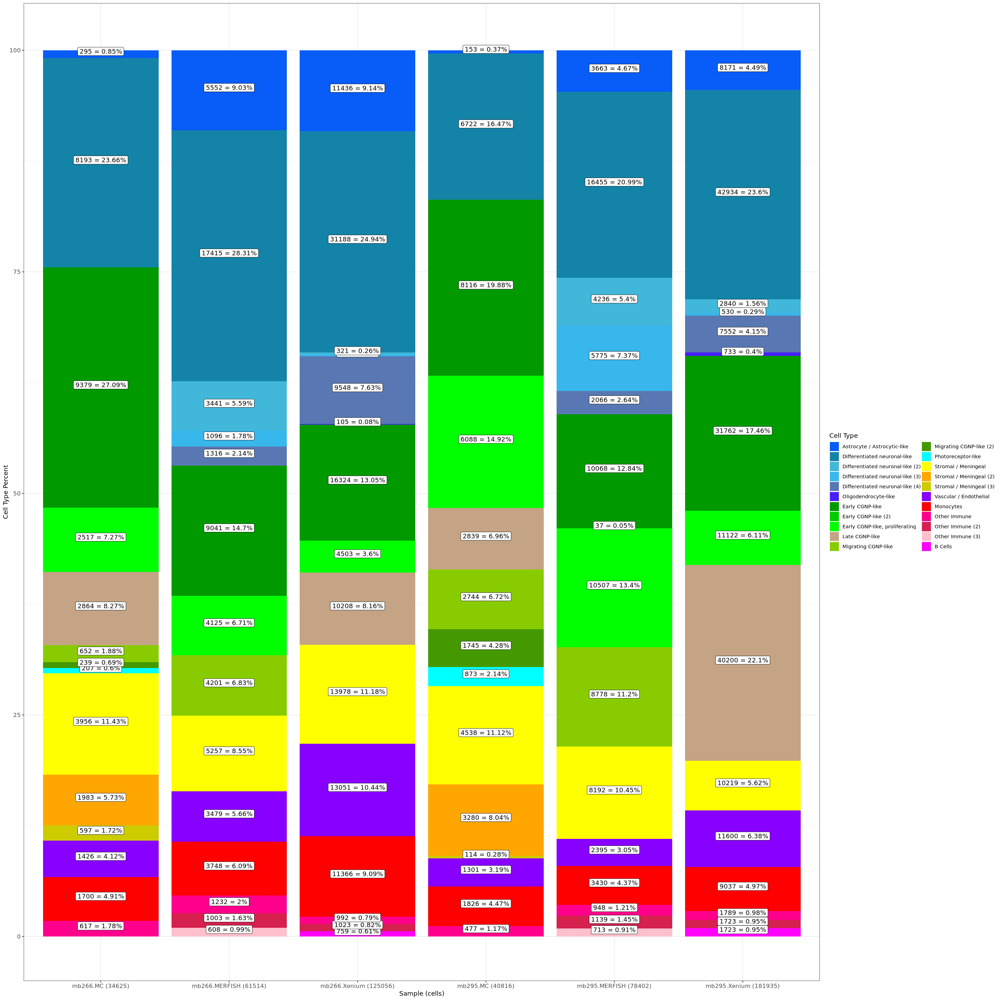

In [11]:
options(repr.plot.width=24, repr.plot.height=24)

# Barplot of cell type frequencies by sample
sample_barplot <- ggplot(data = all_cells_samples) +
    geom_bar(mapping = aes(x = sample_name, y = percent, fill = ordering), stat = "identity") +
    geom_label(mapping = aes(x = sample_name, y = percent, label = count_labels), position = position_stacknudge(vjust = 0.5, y = 0.3)) +
    scale_fill_manual(values = palette, name = "Cell Type") +
    scale_y_continuous(name = "Cell Type Percent") +
    scale_x_discrete(name = "Sample (cells)", breaks = unique(all_cells_samples$sample_name), labels = unique(all_cells_samples$breaks)) +
    theme_bw() + theme(axis.text.x = element_text(size = 10), axis.text.y = element_text(size = 10))

ggsave(plot = sample_barplot, filename = "./plots/sample_barplot.pdf", width = 24, height = 24)
print(sample_barplot)

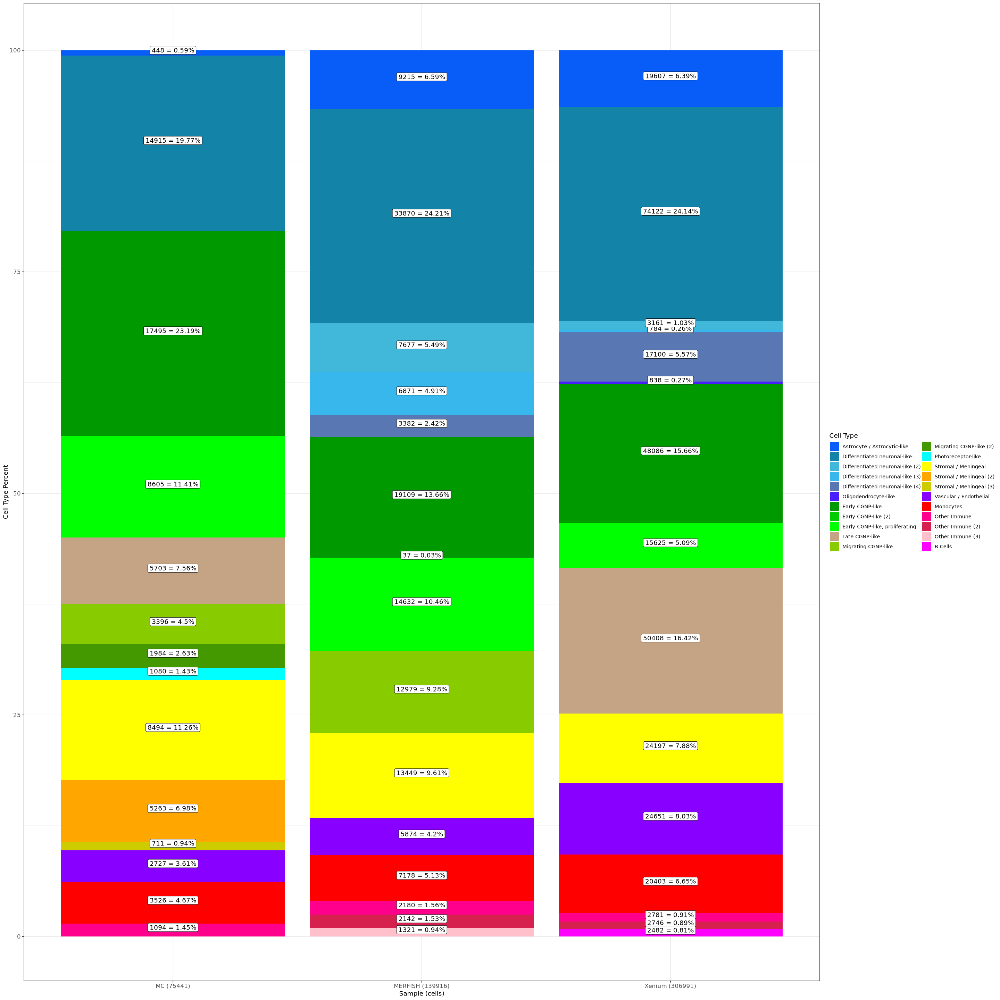

In [12]:
options(repr.plot.width=24, repr.plot.height=24)

# Barplot of cell type frequencies by technology
tech_barplot <- ggplot(data = all_cells_tech) +
    geom_bar(mapping = aes(x = spatial_tech, y = percent, fill = ordering), stat = "identity") +
    geom_label(mapping = aes(x = spatial_tech, y = percent, label = count_labels), position = position_stacknudge(vjust = 0.5, y = 0.3)) +
    scale_fill_manual(values = palette, name = "Cell Type") +
    scale_y_continuous(name = "Cell Type Percent") +
    scale_x_discrete(name = "Sample (cells)", breaks = unique(all_cells_tech$spatial_tech), labels = unique(all_cells_tech$breaks)) +
    theme_bw() + theme(axis.text.x = element_text(size = 10), axis.text.y = element_text(size = 10))
tech_barplot
ggsave(plot = tech_barplot, filename = "./plots/spatialtech_barplot.pdf", width = 24, height = 24)


In [36]:
# Theme for cell type overlays
image_theme <- theme(legend.position = 'none', panel.grid.major = element_blank(),
                panel.grid.minor = element_blank(), panel.background = element_blank())

Saving 6.67 x 6.67 in image
Saving 6.67 x 6.67 in image
Saving 6.67 x 6.67 in image


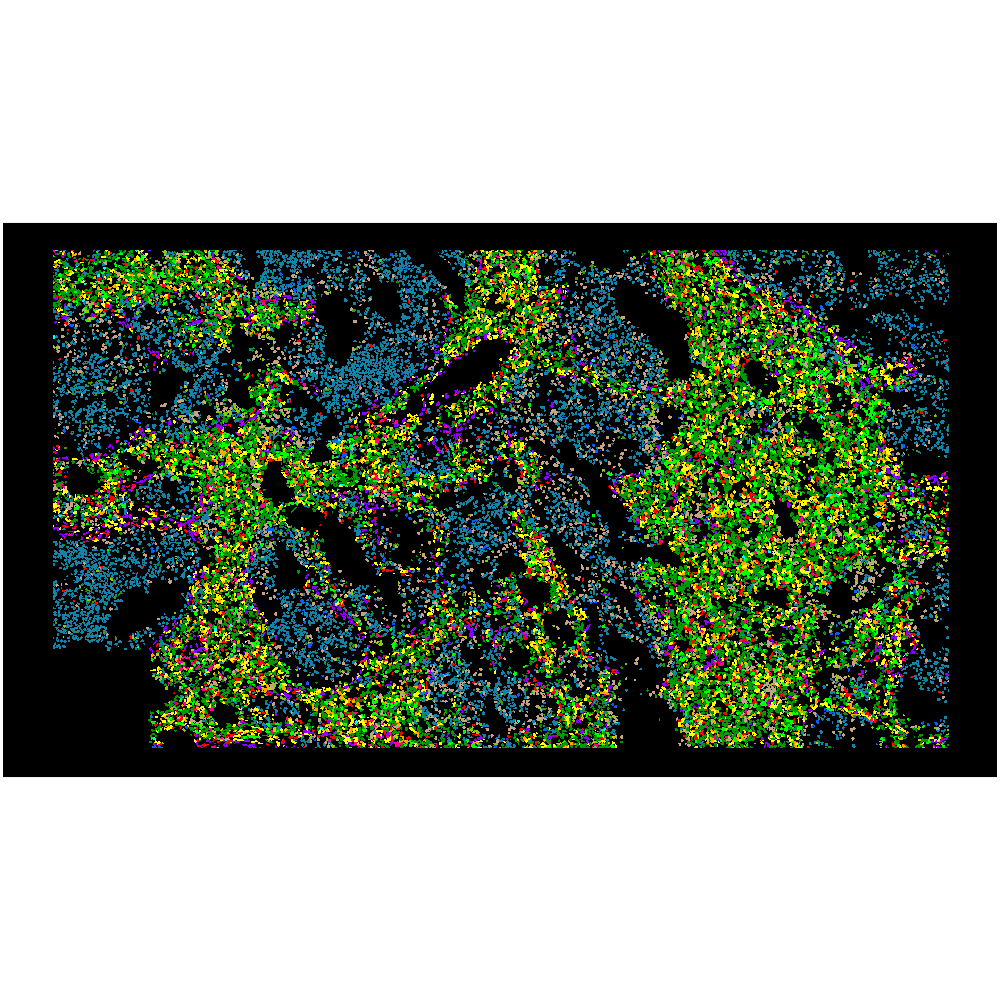

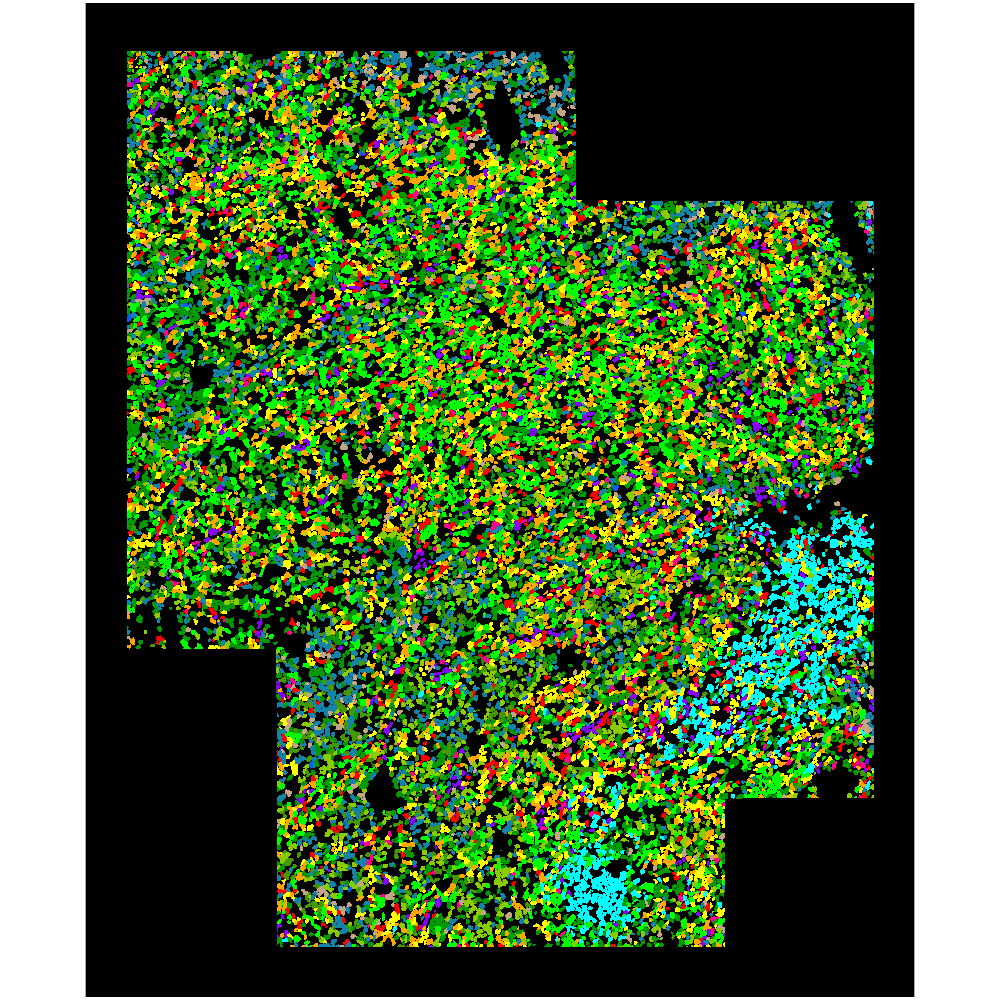

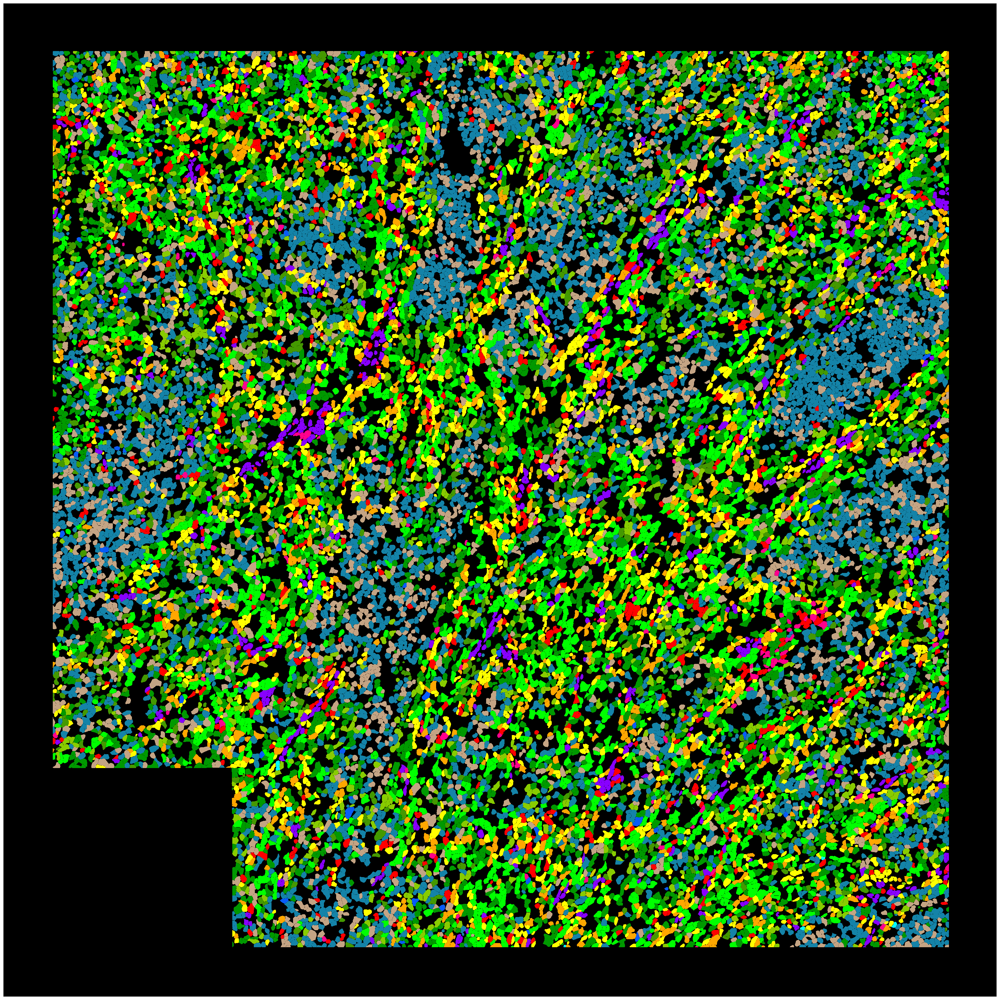

In [37]:
# Molecultary Cartography cell type overlays for all ROIS
mb266.w5a1.MC <- ImageDimPlot(mc_matched_hm, fov = "mb266.w5a1.Resolve", cols = palette, axes = FALSE,
             border.size = NA, group.by = mc_resolution) + image_theme
mb295.w6a1.MC <- ImageDimPlot(mc_matched_hm, fov = "mb295.w6a1.Resolve", cols = palette, axes = FALSE,
             border.size = NA, group.by = mc_resolution) + image_theme
mb295.w6a2.MC <- ImageDimPlot(mc_matched_hm, fov = "mb295.w6a2.Resolve", cols = palette, axes = FALSE,
             border.size = NA, group.by = mc_resolution) + image_theme
             
ggsave(plot = mb266.w5a1.MC, filename = "./overlays/mb266.w5a1.MC.pdf", dpi = 1000)
ggsave(plot = mb295.w6a1.MC, filename = "./overlays/mb295.w6a1.MC.pdf", dpi = 1000)
ggsave(plot = mb295.w6a2.MC, filename = "./overlays/mb295.w6a2.MC.pdf", dpi = 1000)

print(mb266.w5a1.MC)
print(mb295.w6a1.MC)
print(mb295.w6a2.MC)

Warning message:
“Adding image data that isn't associated with any assays”
Warning message:
“Adding image data that isn't associated with any assays”
Saving 6.67 x 6.67 in image
Saving 6.67 x 6.67 in image


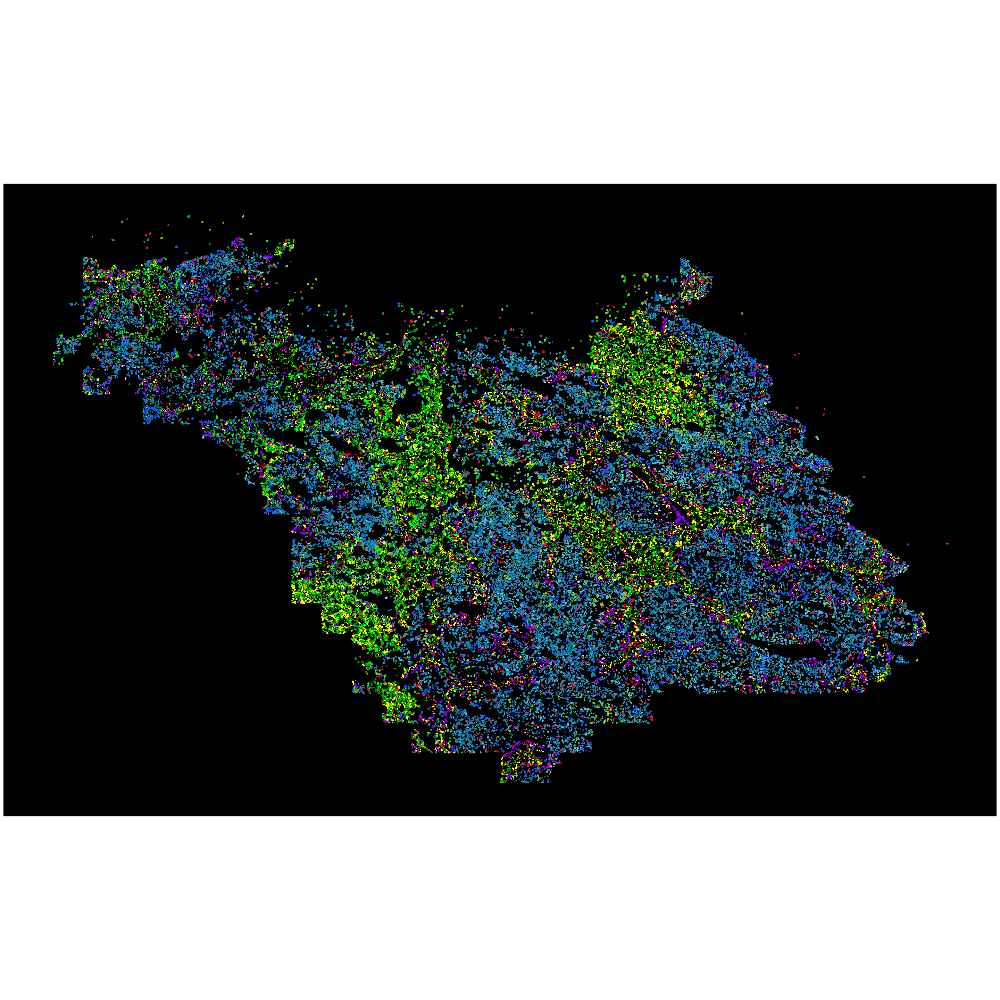

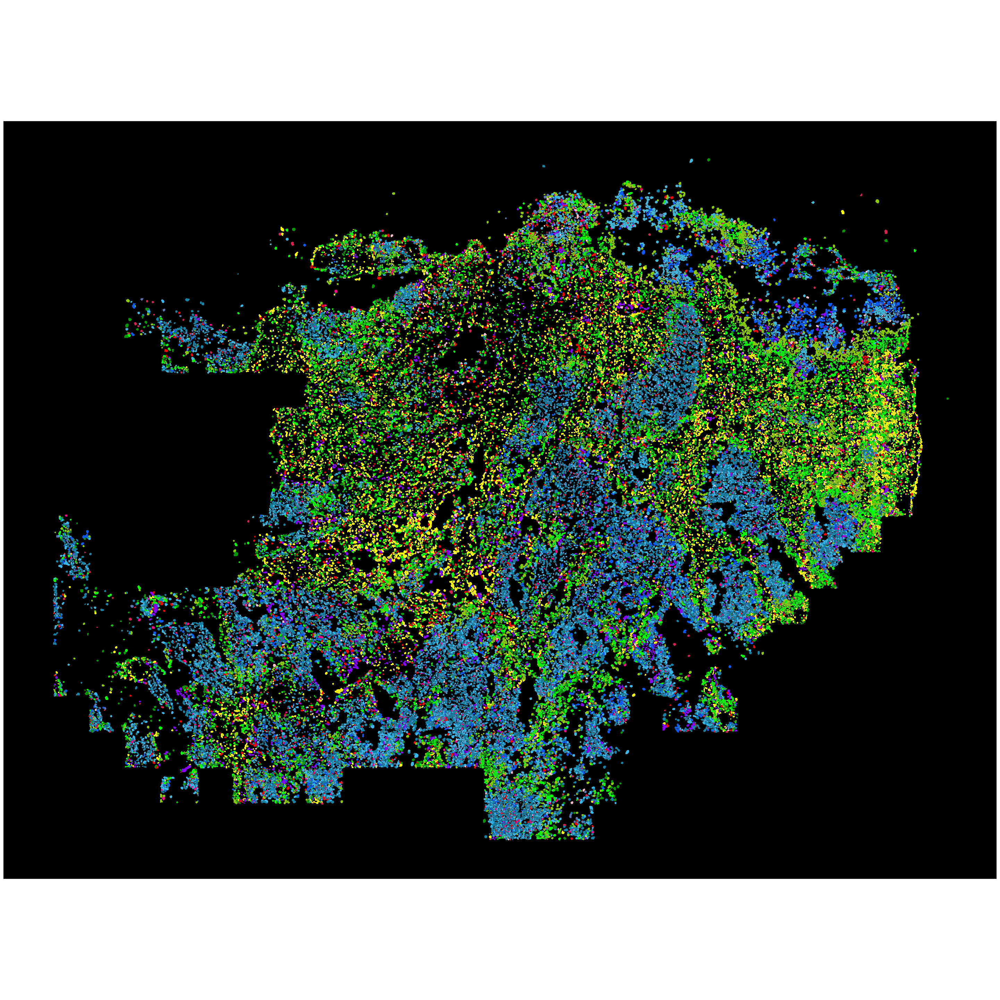

In [38]:
# Merscope cell type overlays for all ROIS
DefaultBoundary(vz_matched_hm[["mb266.region1.Vizgen"]]) <- "segmentation"
DefaultBoundary(vz_matched_hm[["mb295.region0.Vizgen"]]) <- "segmentation"

mb266.region1.Merscope <- ImageDimPlot(vz_matched_hm, fov = "mb266.region1.Vizgen", cols = palette, axes = FALSE,
             border.size = NA, group.by = vz_resolution)  + image_theme
mb295.region0.Merscope <- ImageDimPlot(vz_matched_hm, fov = "mb295.region0.Vizgen", cols = palette, axes = FALSE,
             border.size = NA, group.by = vz_resolution)  + image_theme

ggsave(plot = mb266.region1.Merscope, filename = "./overlays/mb266.region1.Merscope.pdf", dpi = 1000)
ggsave(plot = mb295.region0.Merscope, filename = "./overlays/mb295.region0.Merscope.pdf", dpi = 1000)

print(mb266.region1.Merscope)
print(mb295.region0.Merscope)

In [39]:
# Split the MB295 FOV for Xenium in two FOVs to make it fit in the plots

# create a Crop
top_cropped_coords <- Crop(xen_matched_hm[["mb295.Xenium"]], y = c(0, 5000), x = c(0, 5500), coords = "tissue")
bot_cropped_coords <- Crop(xen_matched_hm[["mb295.Xenium"]], y = c(0, 5000), x = c(5500, 11000), coords = "tissue")
# set a new field of view (fov)
xen_matched_hm[["TOP"]] <- top_cropped_coords
xen_matched_hm[["BOT"]] <- bot_cropped_coords

Warning message:
“Adding image data that isn't associated with any assays”
Warning message:
“Key ‘Xenium_’ taken, using ‘top_’ instead”
Warning message:
“Adding image data that isn't associated with any assays”
Warning message:
“Key ‘Xenium_’ taken, using ‘bot_’ instead”


Warning message:
“Adding image data that isn't associated with any assays”
Warning message:
“Key ‘Xenium_’ taken, using ‘mb266xenium_’ instead”
Warning message:
“Adding image data that isn't associated with any assays”
Warning message:
“Adding image data that isn't associated with any assays”
Saving 6.67 x 6.67 in image
Saving 6.67 x 6.67 in image
Saving 6.67 x 6.67 in image


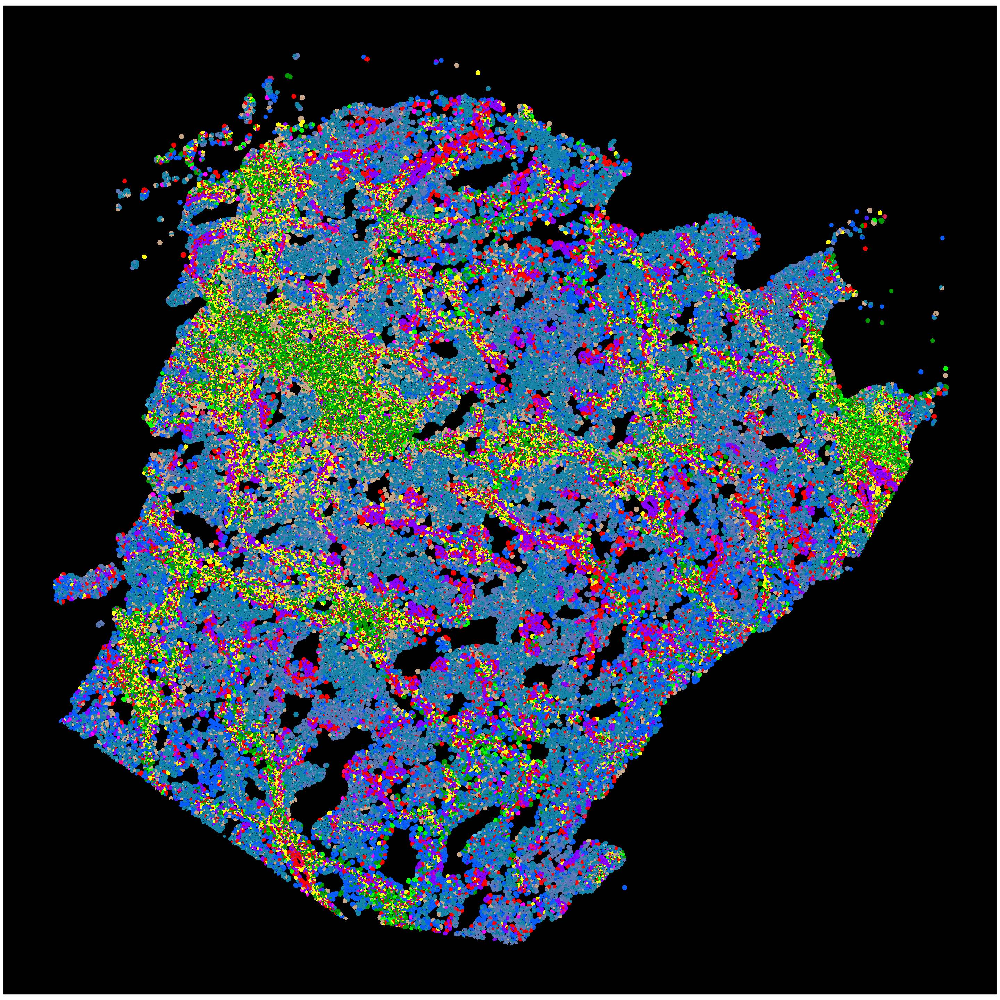

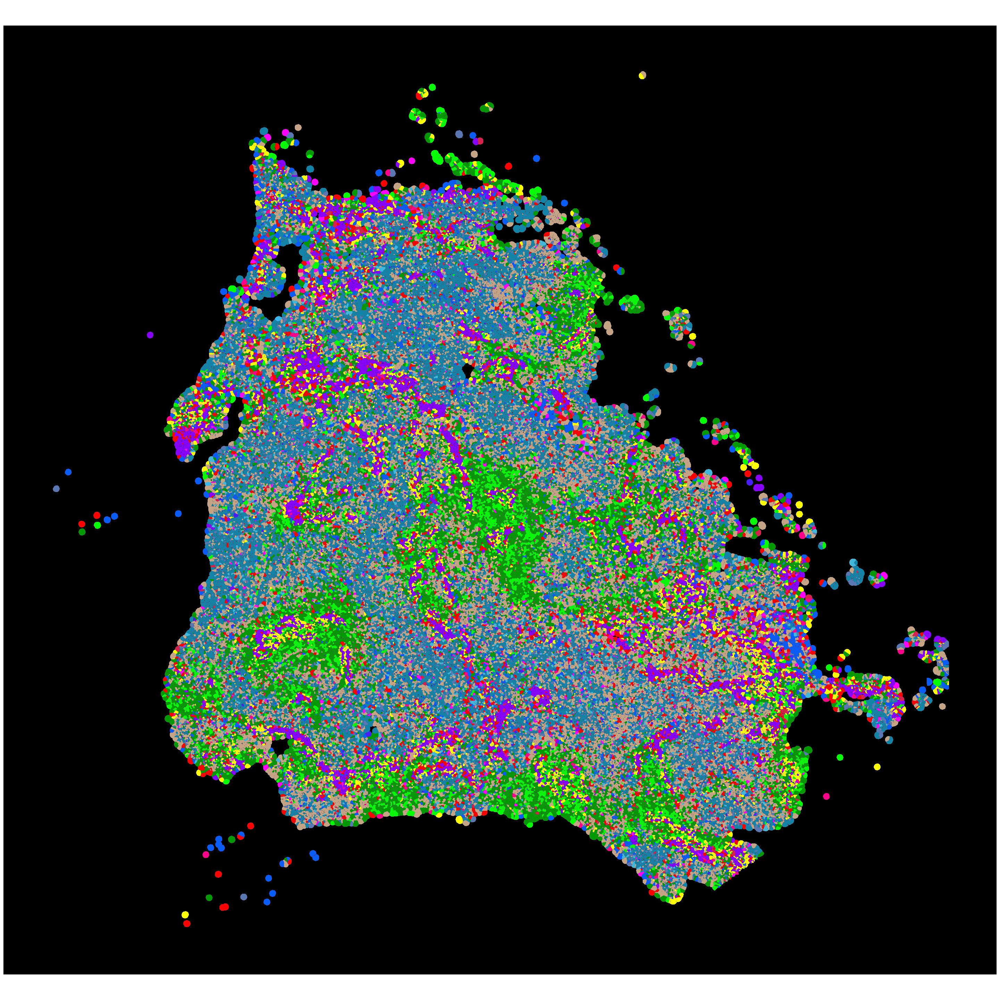

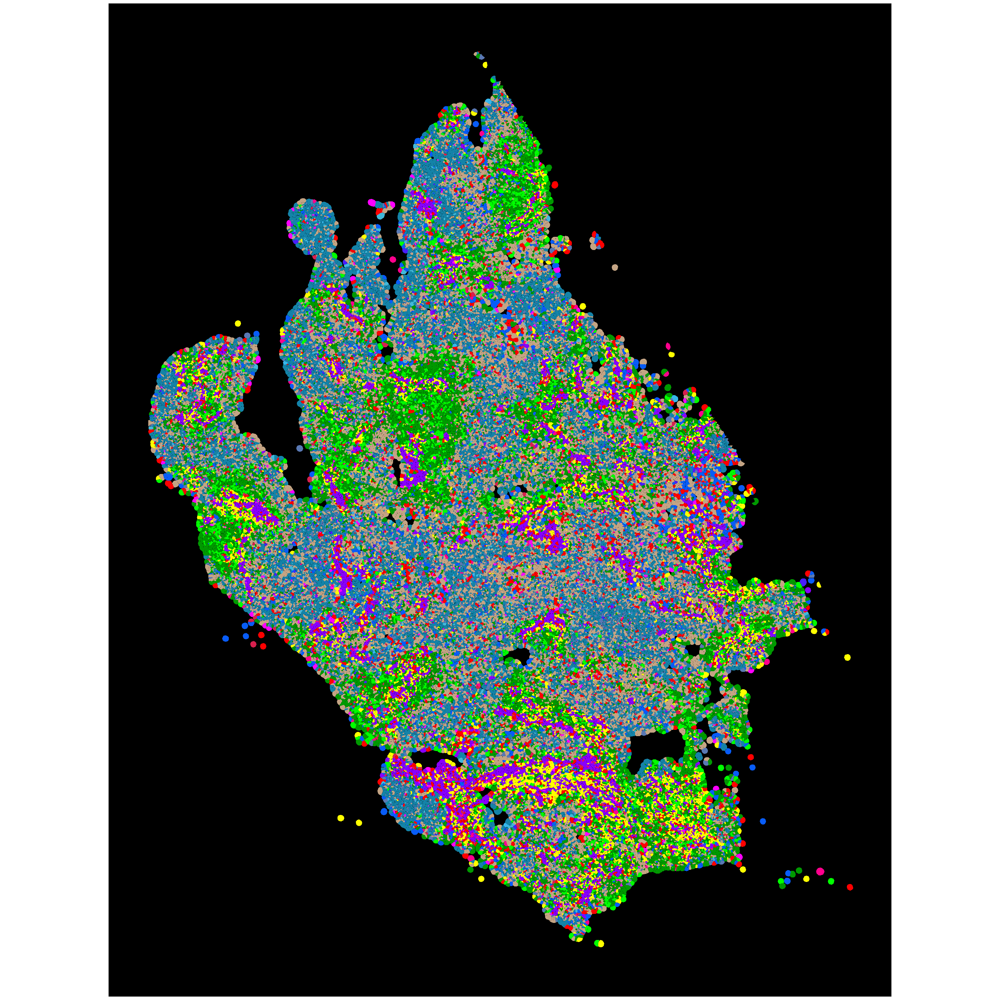

In [40]:
# Xenium cell type overlays for all ROIS

DefaultBoundary(xen_matched_hm[["mb266.Xenium"]]) <- "segmentation"
DefaultBoundary(xen_matched_hm[["TOP"]]) <- "segmentation"
DefaultBoundary(xen_matched_hm[["BOT"]]) <- "segmentation"

mb266_Xenium <- ImageDimPlot(xen_matched_hm, fov = "mb266.Xenium", cols = palette,
             axes = FALSE, border.size = NA, group.by = xen_resolution)  + image_theme
mb295_Xenium_TOP <- ImageDimPlot(xen_matched_hm, fov = "TOP", cols = palette,
             axes = FALSE, border.size = NA, group.by = xen_resolution)  + image_theme
mb295_Xenium_BOT <- ImageDimPlot(xen_matched_hm, fov = "BOT", cols = palette,
             axes = FALSE, border.size = NA, group.by = xen_resolution)  + image_theme

ggsave(plot = mb266_Xenium, filename = "./overlays/mb266.Xenium.pdf", dpi = 1000)
ggsave(plot = mb295_Xenium_TOP, filename = "./overlays/mb295.TOP.Xenium.pdf", dpi = 1000)
ggsave(plot = mb295_Xenium_BOT, filename = "./overlays/mb295.BOT.Xenium.pdf", dpi = 1000)

print(mb266_Xenium)
print(mb295_Xenium_TOP)
print(mb295_Xenium_BOT)

Saving 6.67 x 6.67 in image
Saving 6.67 x 6.67 in image


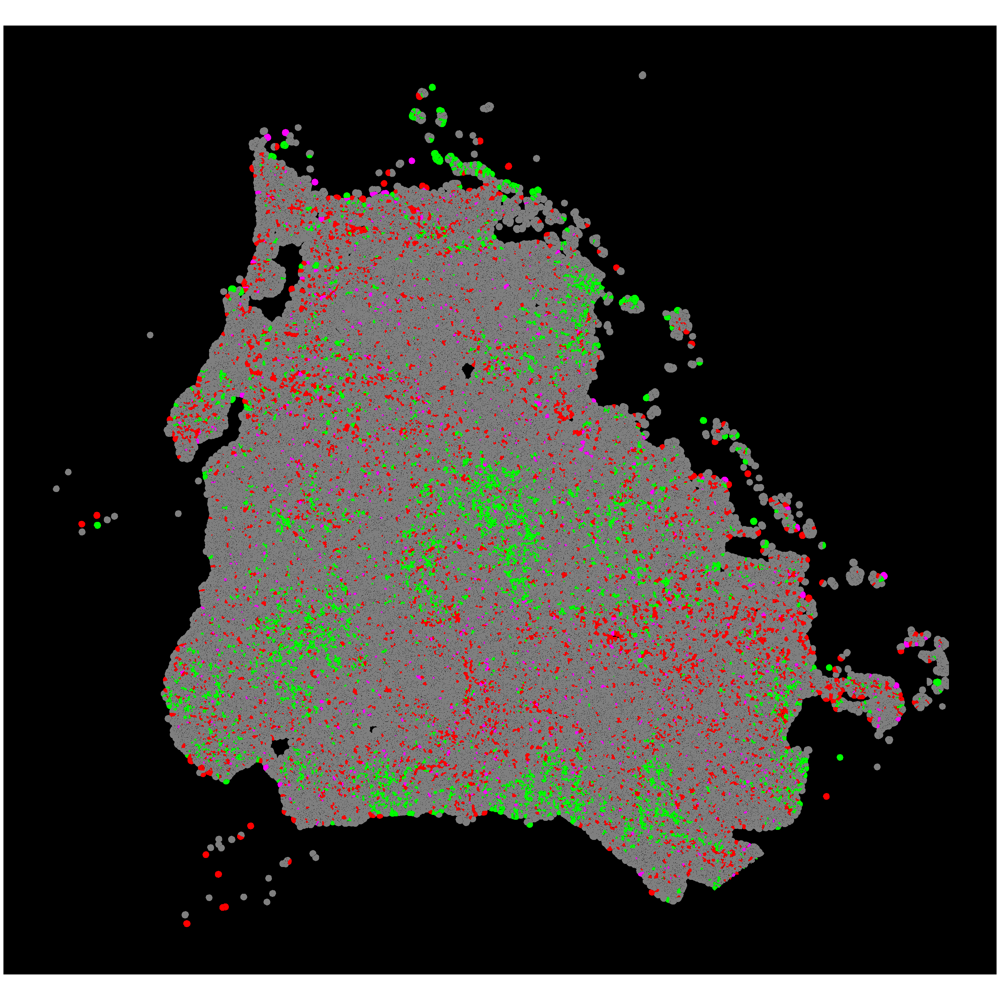

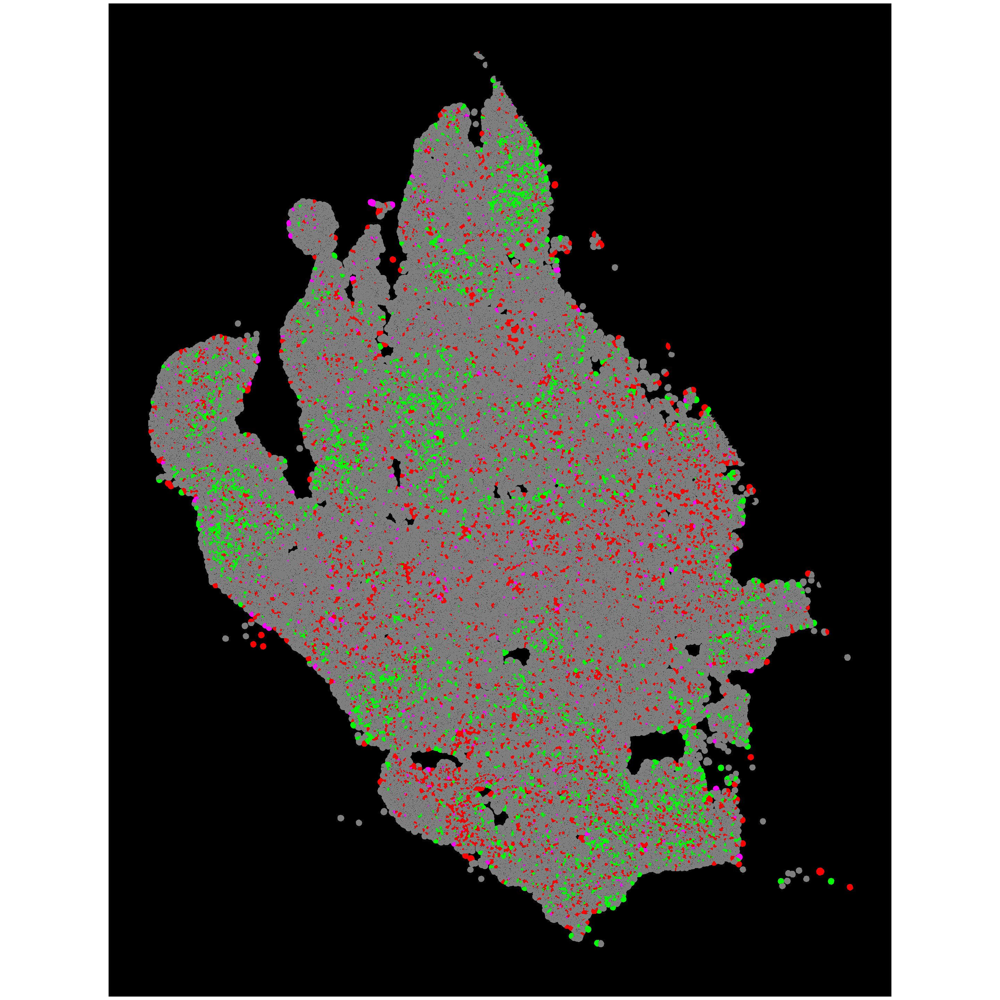

In [41]:
# Redraw an overlay for MB295 in Xenium focusing on immune and proliferating cells

palette_lunaphore <- c(
    "Early CGNP-like, proliferating" = "#00FF00FF", # Bright Green
    "Monocytes" = "#FF0000FF", # Red
    "Other Immune" = "#FF0000FF",
    "Other Immune (2)" = "#FF0000FF",
    "Other Immune (3)" = "#FF0000FF",
    "Other Immune (4)" = "#FF0000FF",
    "B Cells" = "#FF00FFFF" # Magenta 
)

mb295_Xenium_TOP <- ImageDimPlot(xen_matched_hm, fov = "TOP", cols = palette_lunaphore,
             axes = FALSE, border.size = NA, group.by = xen_resolution)  + image_theme
mb295_Xenium_BOT <- ImageDimPlot(xen_matched_hm, fov = "BOT", cols = palette_lunaphore,
             axes = FALSE, border.size = NA, group.by = xen_resolution)  + image_theme

ggsave(plot = mb295_Xenium_TOP, filename = "./plots/mb295.TOP.Xenium_ImmuneProliferating.pdf", dpi = 1000)
ggsave(plot = mb295_Xenium_BOT, filename = "./plots/mb295.BOT.Xenium_ImmuneProliferating.pdf", dpi = 1000)

print(mb295_Xenium_TOP)
print(mb295_Xenium_BOT)